In [80]:
import xenaPython as xena

host = "https://tcga.xenahubs.net"

# we will look at 5 cancers, listed here in order:
# bladder, colon, prostate, rectal, testicular
cohorts = ['BLCA','COAD','PRAD','READ','TGCT']

# we will look at 6 different datasets
# the following lists the name of each of the 6 datasets
datasets = ['gistic2','methylation450k','curated_survival_data','gene_illumina','exon_illumina', 'protein_expression_RPPA']

# compile the dataset ids for every cohort for each dataset as a dictionary
# each dictionary maps a cohort string representing a cancer type, e.g. 'TGCT' 
# with the string value representing the id for that dataset in that cohort

# dataset ids for Gistic2 dataset
dataset_gistic2 = dict([(c,'TCGA.' + c + '.sampleMap/Gistic2_CopyNumber_Gistic2_all_data_by_genes') for c in cohorts])

# dataset ids for methlyation450k dataset
dataset_450k = dict([(c,'TCGA.' + c + '.sampleMap/HumanMethylation450') for c in cohorts])

# dataset ids for phenotype curated survival dataset
dataset_phenotype_survival = dict([(c,'survival/' + c + '_survival.txt') for c in cohorts])

# dataset ids for gene expression illumina hiseq dataset
dataset_gene_expression = dict([(c,'TCGA.' + c + '.sampleMap/HiSeqV2') for c in cohorts])

dataset_exon_expression = dict([(c,'TCGA.' + c + '.sampleMap/HiSeqV2_exon') for c in cohorts])

dataset_protein_expression = dict([(c,'TCGA.' + c + '.sampleMap/RPPA_RBN') for c in cohorts])

# collect all dictionaries of ids for different datasets and place in a list
dataset_ids_list = [dataset_gistic2,dataset_450k,dataset_phenotype_survival,
                    dataset_gene_expression,dataset_exon_expression, dataset_protein_expression]

# use the created list above to make a dictionary, where every entry is a mapping
# from a string representing a dataset, e.g. 'gistic2' with the dictionary holding
# the string ids of each gistic2 dataset in each of the 6 cancers being analysed
dataset_ids_dict = dict(zip(datasets,dataset_ids_list))

# showing what is stored in this dictionary
for dataset in dataset_ids_dict:
    print(dataset,":") # the key of the entry
    
    dataset_ids = dataset_ids_dict[dataset] # get the dictionary value mapped to this key
    
    # for each entry in this dictionary, print the key and entry
    for data_id in dataset_ids:
        print("\t",data_id,": ",dataset_ids[data_id])

gistic2 :
	 BLCA :  TCGA.BLCA.sampleMap/Gistic2_CopyNumber_Gistic2_all_data_by_genes
	 COAD :  TCGA.COAD.sampleMap/Gistic2_CopyNumber_Gistic2_all_data_by_genes
	 PRAD :  TCGA.PRAD.sampleMap/Gistic2_CopyNumber_Gistic2_all_data_by_genes
	 READ :  TCGA.READ.sampleMap/Gistic2_CopyNumber_Gistic2_all_data_by_genes
	 TGCT :  TCGA.TGCT.sampleMap/Gistic2_CopyNumber_Gistic2_all_data_by_genes
methylation450k :
	 BLCA :  TCGA.BLCA.sampleMap/HumanMethylation450
	 COAD :  TCGA.COAD.sampleMap/HumanMethylation450
	 PRAD :  TCGA.PRAD.sampleMap/HumanMethylation450
	 READ :  TCGA.READ.sampleMap/HumanMethylation450
	 TGCT :  TCGA.TGCT.sampleMap/HumanMethylation450
curated_survival_data :
	 BLCA :  survival/BLCA_survival.txt
	 COAD :  survival/COAD_survival.txt
	 PRAD :  survival/PRAD_survival.txt
	 READ :  survival/READ_survival.txt
	 TGCT :  survival/TGCT_survival.txt
gene_illumina :
	 BLCA :  TCGA.BLCA.sampleMap/HiSeqV2
	 COAD :  TCGA.COAD.sampleMap/HiSeqV2
	 PRAD :  TCGA.PRAD.sampleMap/HiSeqV2
	 READ :

In [81]:
import numpy as np

# a function which creates the X and Y arrays needed to train a decision tree classifier with
# Parameters:
# dataset - a string representing the dataset to classify on, e.g. 'ginsic2'
# cohorts - a list of strings representing which cancer types to classify, e.g. ['TGCT','PRAD','READ']
def getXY(dataset,cohorts):
    
    X = []
    Y = []
    
    for cohort in cohorts: # for every cancer type
        
        dataset_id = dataset_ids_dict[dataset][cohort] # get the dataset id string
        samples_needed = xena.dataset_samples(host,dataset_id,200) # get a max. of 200 samples from this cohort dataset
        
        print("Number of samples is in ",cohort," is ",len(samples_needed))
         
        probes = xena.dataset_field_examples(host,dataset_id,500) 
        
        [position,vals] = xena.dataset_probe_values(host,dataset_id,samples_needed,probes) # get values
        
        print("Dimensions for vals is ",len(vals),"x",len(vals[0]))
        
        vals_array = np.array(vals)
        
        print("Dimensions of vals_array is ",len(vals_array),"x",len(vals_array[0]))
        
        vals_list = vals_array.T.tolist()
        
        print("Dimensions of vals_list is ",len(vals_list),"x",len(vals_list[0]))
        
        for j in range(len(vals_list)):
            
            X.append(vals_list[j]) # add array of length n representing n-dimensional sample
            Y.append(cohort) # add the cohort string denoting the cancer type - this is the label on the training data
            
    return X,Y

In [82]:
#  a function which returns a list of the probes associated with a given dataset and cohort, max of 500
def getProbes(dataset,cohort):
    
    dataset_id = dataset_ids_dict[dataset][cohort]
    
    probes = xena.dataset_field_examples(host,dataset_id,500)
    
    return probes

In [83]:
# a function that checks that every sample in the X array has the same length
def check_samples_equal_length(X):
    
    sample_length = len(X[0])
    
    for sample in X:
        
        if (len(sample) != sample_length): # if a sample has a different length from the first sample
            return False 
    
    print("All samples have length ",sample_length) # prints message to confirm that all samples have same length
    return True

In [84]:
import numpy as np

# a function which creates the X and Y arrays needed to train a decision tree classifier with
# Parameters:
# dataset - a string representing the dataset to classify on, e.g. 'ginsic2'
# cohorts - a list of strings representing which cancer types to classify, e.g. ['TGCT','PRAD','READ']
def getXY_limited(dataset, cohorts, limit):
    
    X = [[],[]]
    Y = []
    
    for i in range(limit): # for every cancer type
        
        dataset_id = dataset_ids_dict[dataset][cohorts[i]] # get the dataset id string
        samples_needed = xena.dataset_samples(host,dataset_id,200) # get a max. of 200 samples from this cohort dataset
        
        print("Number of samples in ",cohorts[i]," is ",len(samples_needed))
         
        probes = xena.dataset_field_examples(host,dataset_id,500) 
        
        [position,vals] = xena.dataset_probe_values(host,dataset_id,samples_needed,probes) # get values
        
        print("Dimensions for vals is ",len(vals),"x",len(vals[0]))
        
        vals_array = np.array(vals)
        
        print("Dimensions of vals_array is ",len(vals_array),"x",len(vals_array[0]))
        
        vals_list = vals_array.T.tolist()
        
        print("Dimensions of vals_list is ",len(vals_list),"x",len(vals_list[0]))
        
        for j in range(len(vals_list)):
            
            X[i].append(vals_list[j]) # add array of length n representing n-dimensional sample
            Y.append(cohorts[i]) # add the cohort string denoting the cancer type - this is the label on the training data
            
    return X,Y

X,Y = getXY_limited('protein_expression_RPPA',cohorts,2)

Number of samples in  BLCA  is  127
Dimensions for vals is  132 x 127
Dimensions of vals_array is  132 x 127
Dimensions of vals_list is  127 x 132
Number of samples in  COAD  is  200
Dimensions for vals is  132 x 200
Dimensions of vals_array is  132 x 200
Dimensions of vals_list is  200 x 132


In [85]:
largest1 = []
largest2 = []

def get_largest_proteins(dataset, largest):
    
    for sample in dataset:               
        sample.remove(sample[len(sample)-1])

    for sample in dataset:
        element = max(sample)
        i = sample.index(element)
        
        largest.append((element, i))
        
    #print(largest)
        
        
get_largest_proteins(X[0], largest1)
get_largest_proteins(X[1], largest2)

common = []
for sample1 in largest1:
    for sample2 in largest2:
        if (sample1[1] == sample2[1]):
            common.append(sample2[1])
            


def Nmaxelements(list1, N): 
    final_list = [] 
    index_list = []
  
    for i in range(0, N):  
        max1 = 0
        max_index = 0
          
        for j in range(len(list1)):      
            if list1[j] > max1: 
                max1 = list1[j]; 
                max_index = j
                  
        list1.remove(max1); 
        final_list.append(max1) 
        index_list.append(max_index)
      
    print(index_list) 
    print(final_list) 
    

#Nmaxelements(largest_variables_1, 10)
#Nmaxelements(largest_variables_2, 10)

COAD_gistic2_probes = getProbes('protein_expression_RPPA','COAD')
BLCA_gistic2_probes = getProbes('protein_expression_RPPA','BLCA')

# finding out what the 11th index probe value is and ensuring they're the same
for i in set(common):
    print(COAD_gistic2_probes[i])

#print(BLCA_gistic2_probes[130])
#print(len(largest_variables_1))
#print(len(largest_variables_2))

HSP70
CLAUDIN7
INPP4B
P53
MAPKPT202Y204
ASNS
EGFRPY1068
SRCPY416
CASPASE7CLEAVEDD198
CAVEOLIN1
HER2
FIBRONECTIN
PAI1


In [86]:
# get the X and Y values for decision tree classifier for the gistic2 dataset of all 5 cancers we are testing
X,Y = getXY('gistic2',cohorts)

Number of samples is in  BLCA  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  COAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  PRAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  READ  is  165
Dimensions for vals is  500 x 165
Dimensions of vals_array is  500 x 165
Dimensions of vals_list is  165 x 500
Number of samples is in  TGCT  is  150
Dimensions for vals is  500 x 150
Dimensions of vals_array is  500 x 150
Dimensions of vals_list is  150 x 500


In [87]:
#  this function replaces NaN in the X array with a 0
def replaceNAN(X):
    
    newX = []
    
    for sample in X:
        
        newSample = []
        
        for value in sample:
            if (value == "NaN"):
                newSample.append("0")
            else:
                newSample.append(value)
        
        newX.append(newSample)
    
    return newX
    

In [88]:
# Checking that all samples in X are the same length
print(check_samples_equal_length(X))
print("There are ",len(X), " samples altogether")

All samples have length  500
True
There are  915  samples altogether


In [89]:
import sklearn as sk
from sklearn import tree
import matplotlib.pyplot as plt

In [90]:
# classify on gistct2 data
classifier = tree.DecisionTreeClassifier(max_depth=4)
classifier.fit(X,Y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

[Text(3039.1071428571427, 4892.4, 'X[11] <= 0.84\ngini = 0.797\nsamples = 915\nvalue = [200, 200, 200, 165, 150]'),
 Text(1594.2857142857142, 3805.2, 'X[29] <= 0.133\ngini = 0.766\nsamples = 783\nvalue = [195, 198, 200, 159, 31]'),
 Text(797.1428571428571, 2718.0, 'X[74] <= -0.029\ngini = 0.661\nsamples = 384\nvalue = [85, 58, 196, 19, 26]'),
 Text(398.57142857142856, 1630.7999999999997, 'X[445] <= 0.013\ngini = 0.607\nsamples = 71\nvalue = [39, 1, 6, 5, 20]'),
 Text(199.28571428571428, 543.5999999999995, 'gini = 0.432\nsamples = 45\nvalue = [33, 1, 6, 5, 0]'),
 Text(597.8571428571429, 543.5999999999995, 'gini = 0.355\nsamples = 26\nvalue = [6, 0, 0, 0, 20]'),
 Text(1195.7142857142858, 1630.7999999999997, 'X[335] <= -0.008\ngini = 0.574\nsamples = 313\nvalue = [46, 57, 190, 14, 6]'),
 Text(996.4285714285713, 543.5999999999995, 'gini = 0.686\nsamples = 74\nvalue = [11, 34, 20, 5, 4]'),
 Text(1395.0, 543.5999999999995, 'gini = 0.462\nsamples = 239\nvalue = [35, 23, 170, 9, 2]'),
 Text(23

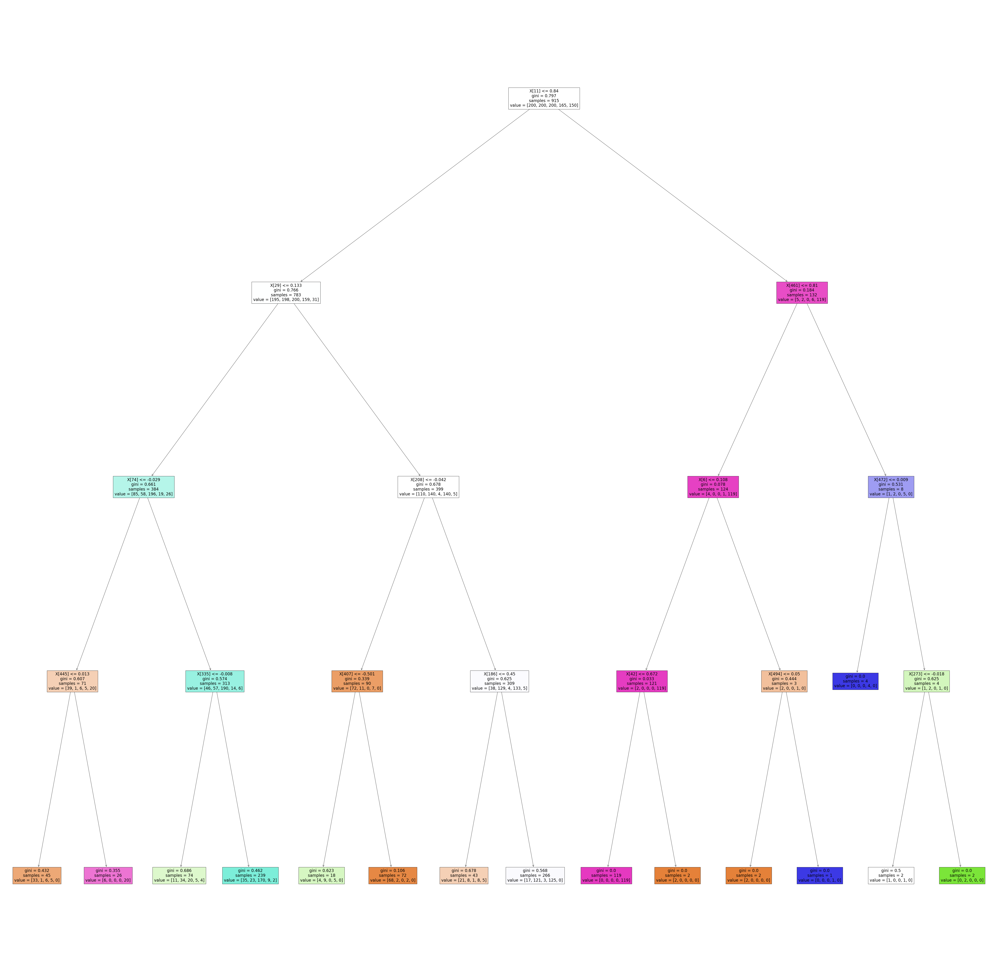

In [91]:
# show decision tree classifying cancers on gistic2 data
plt.figure(figsize=[100.,100.])

tree.plot_tree(classifier,filled=True)

In [16]:
# get the probe values for gistic2 for each cancer

TGCT_gistic2_probes = getProbes('gistic2','TGCT')
PRAD_gistic2_probes = getProbes('gistic2','PRAD')
READ_gistic2_probes = getProbes('gistic2','READ')
COAD_gistic2_probes = getProbes('gistic2','COAD')
BLCA_gistic2_probes = getProbes('gistic2','BLCA')

# finding out what the 11th index probe value is and ensuring they're the same
print(TGCT_gistic2_probes [461])
print(PRAD_gistic2_probes [461])
print(READ_gistic2_probes [461])
print(COAD_gistic2_probes [461])
print(BLCA_gistic2_probes [461])

AHCY
AHCY
AHCY
AHCY
AHCY


In [12]:
# explanation

In [13]:
# getting X and Y for the gene expression data
X,Y = getXY('gene_illumina',cohorts)



Number of samples is in  BLCA  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  COAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  PRAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  READ  is  105
Dimensions for vals is  500 x 105
Dimensions of vals_array is  500 x 105
Dimensions of vals_list is  105 x 500
Number of samples is in  TGCT  is  156
Dimensions for vals is  500 x 156
Dimensions of vals_array is  500 x 156
Dimensions of vals_list is  156 x 500


In [14]:
print(check_samples_equal_length(X))
print("There are ",len(X), " samples altogether")

All samples have length  500
True
There are  861  samples altogether


In [15]:
# classify cancers with three classifier using gene expression data
classifier = tree.DecisionTreeClassifier(max_depth=4)
classifier.fit(X,Y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [16]:
# show decision tree classifying cancers on gene expression data
plt.figure(figsize=[200.,200.])

tree.plot_tree(classifier,filled=True)

[Text(7549.411764705883, 9784.8, 'X[203] <= 10.82\nentropy = 0.79\nsamples = 861\nvalue = [200, 200, 200, 105, 156]'),
 Text(5251.764705882353, 7610.4, 'X[134] <= 10.38\nentropy = 0.74\nsamples = 665\nvalue = [200, 200, 5, 105, 155]'),
 Text(2625.8823529411766, 5436.0, 'X[85] <= 1.149\nentropy = 0.547\nsamples = 366\nvalue = [195, 10, 5, 6, 150]'),
 Text(1312.9411764705883, 3261.5999999999995, 'X[429] <= 8.191\nentropy = 0.237\nsamples = 217\nvalue = [189, 10, 5, 6, 7]'),
 Text(656.4705882352941, 1087.199999999999, 'entropy = 0.116\nsamples = 197\nvalue = [185, 0, 5, 0, 7]'),
 Text(1969.4117647058824, 1087.199999999999, 'entropy = 0.62\nsamples = 20\nvalue = [4, 10, 0, 6, 0]'),
 Text(3938.823529411765, 3261.5999999999995, 'X[177] <= 5.533\nentropy = 0.077\nsamples = 149\nvalue = [6, 0, 0, 0, 143]'),
 Text(3282.3529411764707, 1087.199999999999, 'entropy = 0.0\nsamples = 5\nvalue = [5, 0, 0, 0, 0]'),
 Text(4595.2941176470595, 1087.199999999999, 'entropy = 0.014\nsamples = 144\nvalue = [1

In [17]:
# get the probe values for this gene expression dataset for each cancer

TGCT_gene_illumina_probes = getProbes('gene_illumina','TGCT')
PRAD_gene_illumina_probes = getProbes('gene_illumina','PRAD')
READ_gene_illumina_probes = getProbes('gene_illumina','READ')
COAD_gene_illumina_probes = getProbes('gene_illumina','COAD')
BLCA_gene_illumina_probes = getProbes('gene_illumina','BLCA')

print(TGCT_gene_illumina_probes [134])
print(PRAD_gene_illumina_probes [134])
print(READ_gene_illumina_probes [134])
print(COAD_gene_illumina_probes [134])
print(BLCA_gene_illumina_probes [134])

ABP1
ABP1
ABP1
ABP1
ABP1


In [18]:
# explanation

In [19]:
# testing the dataset methylation450k
X,Y = getXY('methylation450k',cohorts)
X = replaceNAN(X)

Number of samples is in  BLCA  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  COAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  PRAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  READ  is  106
Dimensions for vals is  500 x 106
Dimensions of vals_array is  500 x 106
Dimensions of vals_list is  106 x 500
Number of samples is in  TGCT  is  156
Dimensions for vals is  500 x 156
Dimensions of vals_array is  500 x 156
Dimensions of vals_list is  156 x 500


In [9]:
print(check_samples_equal_length(X))
print("There are ",len(X), " samples altogether")

All samples have length  500
True
There are  915  samples altogether


In [27]:
# building tree classifier on methylation450k data
classifier = tree.DecisionTreeClassifier(max_depth=4)
classifier.fit(X,Y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [28]:
# show decision tree classifying cancers on methylation450k data
plt.figure(figsize=[200.,200.])

tree.plot_tree(classifier,filled=True)

[Text(6078.214285714285, 9784.8, 'X[11] <= 0.84\ngini = 0.797\nsamples = 915\nvalue = [200, 200, 200, 165, 150]'),
 Text(3188.5714285714284, 7610.4, 'X[29] <= 0.133\ngini = 0.766\nsamples = 783\nvalue = [195, 198, 200, 159, 31]'),
 Text(1594.2857142857142, 5436.0, 'X[74] <= -0.029\ngini = 0.661\nsamples = 384\nvalue = [85, 58, 196, 19, 26]'),
 Text(797.1428571428571, 3261.5999999999995, 'X[445] <= 0.013\ngini = 0.607\nsamples = 71\nvalue = [39, 1, 6, 5, 20]'),
 Text(398.57142857142856, 1087.199999999999, 'gini = 0.432\nsamples = 45\nvalue = [33, 1, 6, 5, 0]'),
 Text(1195.7142857142858, 1087.199999999999, 'gini = 0.355\nsamples = 26\nvalue = [6, 0, 0, 0, 20]'),
 Text(2391.4285714285716, 3261.5999999999995, 'X[335] <= -0.008\ngini = 0.574\nsamples = 313\nvalue = [46, 57, 190, 14, 6]'),
 Text(1992.8571428571427, 1087.199999999999, 'gini = 0.686\nsamples = 74\nvalue = [11, 34, 20, 5, 4]'),
 Text(2790.0, 1087.199999999999, 'gini = 0.462\nsamples = 239\nvalue = [35, 23, 170, 9, 2]'),
 Text(4

In [15]:
# get the probe values for methylation450k data for each cancer

TGCT_methylation450k_probes = getProbes('methylation450k','TGCT')
PRAD_methylation450k_probes = getProbes('methylation450k','PRAD')
READ_methylation450k_probes = getProbes('methylation450k','READ')
COAD_methylation450k_probes = getProbes('methylation450k','COAD')
BLCA_methylation450k_probes = getProbes('methylation450k','BLCA')

print(TGCT_methylation450k_probes [11])
print(PRAD_methylation450k_probes [11])
print(READ_methylation450k_probes [11])
print(COAD_methylation450k_probes [11])
print(BLCA_methylation450k_probes [11])

cg00000714
cg00000714
cg00000714
cg00000714
cg00000714


In [24]:
# testing the dataset curated survival data
X,Y = getXY('curated_survival_data',cohorts)
X = replaceNAN(X)

Number of samples is in  BLCA  is  200
Dimensions for vals is  11 x 200
Dimensions of vals_array is  11 x 200
Dimensions of vals_list is  200 x 11
Number of samples is in  COAD  is  200
Dimensions for vals is  11 x 200
Dimensions of vals_array is  11 x 200
Dimensions of vals_list is  200 x 11
Number of samples is in  PRAD  is  200
Dimensions for vals is  11 x 200
Dimensions of vals_array is  11 x 200
Dimensions of vals_list is  200 x 11
Number of samples is in  READ  is  183
Dimensions for vals is  11 x 183
Dimensions of vals_array is  11 x 183
Dimensions of vals_list is  183 x 11
Number of samples is in  TGCT  is  139
Dimensions for vals is  11 x 139
Dimensions of vals_array is  11 x 139
Dimensions of vals_list is  139 x 11


In [25]:
print(check_samples_equal_length(X))
print("There are ",len(X), " samples altogether")

All samples have length  11
True
There are  922  samples altogether


In [16]:
# building tree classifier on survival data
classifier = tree.DecisionTreeClassifier(max_depth=4)
classifier.fit(X,Y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [27]:
# show decision tree classifying cancers on survival data
plt.figure(figsize=[200.,200.])

tree.plot_tree(classifier,filled=True)

[Text(5878.928571428572, 9784.8, 'X[4] <= 0.5\nentropy = 0.797\nsamples = 922\nvalue = [200, 200, 200, 183, 139]'),
 Text(3188.5714285714284, 7610.4, 'X[3] <= 2853.5\nentropy = 0.791\nsamples = 754\nvalue = [105, 162, 200, 152, 135]'),
 Text(1594.2857142857142, 5436.0, 'X[1] <= 6.5\nentropy = 0.784\nsamples = 704\nvalue = [97, 162, 200, 148, 97]'),
 Text(797.1428571428571, 3261.5999999999995, 'X[10] <= 166.5\nentropy = 0.731\nsamples = 258\nvalue = [31, 69, 39, 102, 17]'),
 Text(398.57142857142856, 1087.199999999999, 'entropy = 0.724\nsamples = 234\nvalue = [26, 54, 38, 99, 17]'),
 Text(1195.7142857142858, 1087.199999999999, 'entropy = 0.549\nsamples = 24\nvalue = [5, 15, 1, 3, 0]'),
 Text(2391.4285714285716, 3261.5999999999995, 'X[9] <= 138.5\nentropy = 0.761\nsamples = 446\nvalue = [66, 93, 161, 46, 80]'),
 Text(1992.8571428571427, 1087.199999999999, 'entropy = 0.762\nsamples = 395\nvalue = [48, 93, 135, 39, 80]'),
 Text(2790.0, 1087.199999999999, 'entropy = 0.597\nsamples = 51\nvalu

In [24]:
# get the probe values for survival data for each cancer

TGCT_curated_survival_data_probes = getProbes('curated_survival_data','TGCT')
PRAD_curated_survival_data_probes = getProbes('curated_survival_data','PRAD')
READ_curated_survival_data_probes = getProbes('curated_survival_data','READ')
COAD_curated_survival_data_probes = getProbes('curated_survival_data','COAD')
BLCA_curated_survival_data_probes = getProbes('curated_survival_data','BLCA')

print(TGCT_curated_survival_data_probes)

print(TGCT_curated_survival_data_probes[4])
print(PRAD_curated_survival_data_probes[4])
print(READ_curated_survival_data_probes[4])
print(COAD_curated_survival_data_probes[4])
print(BLCA_curated_survival_data_probes[4])

['DFI', 'DFI.time', 'DSS', 'DSS.time', 'OS', 'OS.time', 'PFI', 'PFI.time', 'Redaction', '_PATIENT', 'sampleID']
OS
OS
OS
OS
OS


In [29]:
# testing the dataset exon expression
X,Y = getXY('exon_illumina',cohorts)
X = replaceNAN(X)

Number of samples is in  BLCA  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  COAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  PRAD  is  200
Dimensions for vals is  500 x 200
Dimensions of vals_array is  500 x 200
Dimensions of vals_list is  200 x 500
Number of samples is in  READ  is  105
Dimensions for vals is  500 x 105
Dimensions of vals_array is  500 x 105
Dimensions of vals_list is  105 x 500
Number of samples is in  TGCT  is  156
Dimensions for vals is  500 x 156
Dimensions of vals_array is  500 x 156
Dimensions of vals_list is  156 x 500


In [30]:
print(check_samples_equal_length(X))
print("There are ",len(X), " samples altogether")

All samples have length  500
True
There are  861  samples altogether


In [21]:
# build tree classifier on exon expression data
classifier = tree.DecisionTreeClassifier(max_depth=4)
classifier.fit(X,Y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [32]:
# show decision tree classifying cancers on exon expression data
plt.figure(figsize=[200.,200.])

tree.plot_tree(classifier,filled=True)

[Text(5580.0, 9784.8, 'X[188] <= 0.428\nentropy = 0.79\nsamples = 861\nvalue = [200, 200, 200, 105, 156]'),
 Text(2790.0, 7610.4, 'X[171] <= 0.896\nentropy = 0.597\nsamples = 369\nvalue = [182, 22, 12, 8, 145]'),
 Text(1395.0, 5436.0, 'X[376] <= 2.262\nentropy = 0.378\nsamples = 218\nvalue = [170, 19, 12, 5, 12]'),
 Text(697.5, 3261.5999999999995, 'X[423] <= 3.05\nentropy = 0.091\nsamples = 170\nvalue = [162, 1, 5, 0, 2]'),
 Text(348.75, 1087.199999999999, 'entropy = 0.036\nsamples = 163\nvalue = [160, 1, 2, 0, 0]'),
 Text(1046.25, 1087.199999999999, 'entropy = 0.653\nsamples = 7\nvalue = [2, 0, 3, 0, 2]'),
 Text(2092.5, 3261.5999999999995, 'X[102] <= 0.295\nentropy = 0.756\nsamples = 48\nvalue = [8, 18, 7, 5, 10]'),
 Text(1743.75, 1087.199999999999, 'entropy = 0.665\nsamples = 22\nvalue = [8, 0, 7, 0, 7]'),
 Text(2441.25, 1087.199999999999, 'entropy = 0.47\nsamples = 26\nvalue = [0, 18, 0, 5, 3]'),
 Text(4185.0, 5436.0, 'X[342] <= 0.02\nentropy = 0.217\nsamples = 151\nvalue = [12, 3, 

In [26]:
# get the probe values for exon expression for each cancer

TGCT_exon_illumina_probes = getProbes('exon_illumina','TGCT')
PRAD_exon_illumina_probes = getProbes('exon_illumina','PRAD')
READ_exon_illumina_probes = getProbes('exon_illumina','READ')
COAD_exon_illumina_probes = getProbes('exon_illumina','COAD')
BLCA_exon_illumina_probes = getProbes('exon_illumina','BLCA')

print(TGCT_exon_illumina_probes[171])
print(PRAD_exon_illumina_probes[171])
print(READ_exon_illumina_probes[171])
print(COAD_exon_illumina_probes[171])
print(BLCA_exon_illumina_probes[171])

chr10:101611259-101611662:+
chr10:101611259-101611662:+
chr10:101611259-101611662:+
chr10:101611259-101611662:+
chr10:101611259-101611662:+
